In [12]:
"""
    Liczy embeddingi CLIP (HuggingFace transformers) dla obrazów w folderze.

    input_dir   – folder z obrazami
    out_csv     – wynikowy CSV zgodny ze skryptem search_image.py
    model_id    – HF model id (musi pasować do nazwy kolumny embeddingu)
    batch_size  – rozmiar batcha (mniej = mniej RAM/VRAM)
"""

from pathlib import Path
import json
import pandas as pd
import torch
from PIL import Image
from tqdm.auto import tqdm
from transformers import CLIPProcessor, CLIPModel

# --- USTAW ---
input_dir = Path("inputs")  # <- Twój folder ze zdjęciami
out_csv   = Path("outputs/cutouts_with_embeddings.csv")
out_csv.parent.mkdir(parents=True, exist_ok=True)

model_id = "openai/clip-vit-base-patch32"
batch_size = 32

# --- device ---
if torch.backends.mps.is_available():
    device = "mps"
elif torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"

model = CLIPModel.from_pretrained(model_id).to(device)
processor = CLIPProcessor.from_pretrained(model_id)
model.eval()

print({"device": device, "model_id": model_id, "batch_size": batch_size})

{'device': 'mps', 'model_id': 'openai/clip-vit-base-patch32', 'batch_size': 32}


In [13]:
"""
    Tworzy CSV:
    - "Cutout Image Path" (ścieżka do pliku)
    - "openai/clip-vit-base-patch32_Embedding" (embedding jako JSON-lista)
"""

exts = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".webp"}
paths = sorted([p for p in input_dir.rglob("*") if p.is_file() and p.suffix.lower() in exts])
print(f"Znaleziono obrazów: {len(paths)}")

CUTOUT_PATH_COLUMN = "Cutout Image Path"
EMBEDDING_COLUMN = f"{model_id}_Embedding"

rows = []

with torch.inference_mode():
    for i in tqdm(range(0, len(paths), batch_size)):
        batch_paths = paths[i:i+batch_size]
        images = []
        ok_paths = []

        for p in batch_paths:
            try:
                images.append(Image.open(p).convert("RGB"))
                ok_paths.append(p)
            except Exception:
                continue

        if not images:
            continue

        inputs = processor(images=images, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}

        feats = model.get_image_features(**inputs)              # [B, D]
        feats = feats / feats.norm(dim=-1, keepdim=True)        # normalizacja (cosine)
        feats = feats.detach().cpu().float().numpy()

        for p, vec in zip(ok_paths, feats):
            rows.append({
                CUTOUT_PATH_COLUMN: str(p),
                EMBEDDING_COLUMN: json.dumps(vec.tolist()),  # zapis jako JSON string
            })

df = pd.DataFrame(rows)
df.to_csv(out_csv, index=False)
print(f"Zapisano: {out_csv} | rekordów: {len(df)} | kolumny: {list(df.columns)}")

Znaleziono obrazów: 136


  0%|          | 0/5 [00:00<?, ?it/s]

Zapisano: outputs/cutouts_with_embeddings.csv | rekordów: 136 | kolumny: ['Cutout Image Path', 'openai/clip-vit-base-patch32_Embedding']


In [17]:
# uruchomienie skryptu jako całości (wykona się “main flow” z pliku)
%run scripts/search_image.py

SyntaxError: invalid syntax (search_image.py, line 85)

In [15]:
"""
    Dropdown do wyboru QUERY_IMAGE_PATH + miniatura obok + uruchomienie search_image.py.

    Wymaga w scripts/search_image.py:
    QUERY_IMAGE_PATH = os.environ.get("QUERY_IMAGE_PATH", QUERY_IMAGE_PATH)
"""

from pathlib import Path
import os
import ipywidgets as W
from IPython.display import display
from PIL import Image
import io

# --- folder z obrazami do wyboru ---
QUERY_DIR = Path("/Users/olga/MetaLogic/inputs")
exts = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".webp"}

query_paths = sorted([p for p in QUERY_DIR.rglob("*") if p.is_file() and p.suffix.lower() in exts])
options = [(p.name, str(p)) for p in query_paths]

dd = W.Dropdown(
    options=options,
    description="Query:",
    layout=W.Layout(width="650px")
)

thumb = W.Image(format="jpeg", width=260, height=260)
out = W.Output()
btn = W.Button(description="Run search_image.py", button_style="primary")

def _set_thumb(path_str: str):
    p = Path(path_str)
    try:
        img = Image.open(p).convert("RGB")
        img.thumbnail((260, 260))
        buf = io.BytesIO()
        img.save(buf, format="JPEG", quality=85)
        thumb.value = buf.getvalue()
    except Exception:
        thumb.value = b""

def _on_change(change):
    if change.get("name") == "value" and change.get("new"):
        _set_thumb(change["new"])

def _run(_):
    with out:
        out.clear_output()
        os.environ["QUERY_IMAGE_PATH"] = dd.value
        print("QUERY_IMAGE_PATH =", os.environ["QUERY_IMAGE_PATH"])
        get_ipython().run_line_magic("run", "scripts/search_image.py")

dd.observe(_on_change, names="value")
btn.on_click(_run)

# init
if dd.value:
    _set_thumb(dd.value)

ui = W.HBox([W.VBox([dd, btn]), thumb])
display(ui, out)

Output()

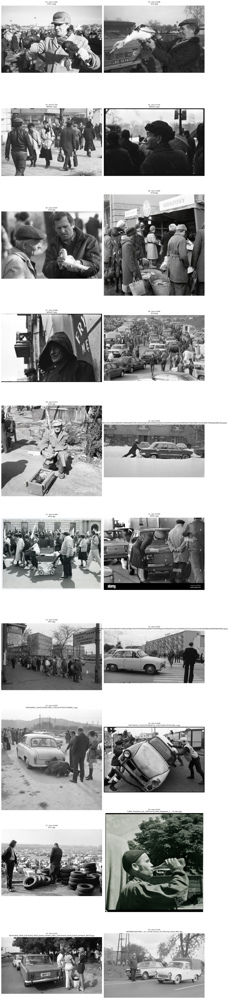

In [16]:
"""
    Wizualizacja TOP 20 nearest neighbors (4x5) z CSV.

    csv_path – pełna ścieżka do nearest_neighbors_details.csv
"""

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

csv_path = Path("/Users/olga/MetaLogic/outputs/image_search_neighbors/nearest_neighbors_details.csv")
img_col = "Cutout Image Path"

df_nn = pd.read_csv(csv_path)

# TOP 20: Similarity malejąco (jeśli jest), inaczej Distance rosnąco
if "Similarity" in df_nn.columns:
    df_top = df_nn.sort_values("Similarity", ascending=False).head(20).reset_index(drop=True)
    mode = "sim"
else:
    df_top = df_nn.sort_values("Distance", ascending=True).head(20).reset_index(drop=True)
    mode = "dist"

rows, cols = 10, 2  # 20 obrazów w 10 wierszach po 2 kolumny
fig, axes = plt.subplots(rows, cols, figsize=(cols * 8, rows * 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    ax.axis("off")
    if i >= len(df_top):
        continue

    p = Path(str(df_top.loc[i, img_col]))

    try:
        img = Image.open(p).convert("RGB")
        ax.imshow(img)

        if mode == "sim":
            score = float(df_top.loc[i, "Similarity"])
            title = f"{i+1:02d}  sim={score:.3f}\n{p.name}"
        else:
            dist = float(df_top.loc[i, "Distance"])
            title = f"{i+1:02d}  dist={dist:.3f}\n{p.name}"

        ax.set_title(title, fontsize=9)

    except Exception:
        ax.set_title(f"{i+1:02d}  MISSING\n{p.name}", fontsize=9)

plt.tight_layout()
plt.show()